Lab3_ShahabEsfandiar_9819373

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise
from skimage import filters
from skimage.morphology import rectangle
from scipy import fftpack
from math import sqrt

Exercise_1

Import images and covert to grayscale mode

In [ ]:
img1 = cv2.imread('1-dot.jpg', 0)
img2 = cv2.imread('3-dots.jpg', 0)
img3 = cv2.imread('annulus-thick-large.jpg', 0)
img4 = cv2.imread('annulus-thin-large.jpg', 0)
img5 = cv2.imread('Asterisk.jpg', 0)
img6 = cv2.imread('disk-large.jpg', 0)
img7 = cv2.imread('disk-small.jpg', 0)
img8 = cv2.imread('disk-small_shifted.jpg', 0)
img9 = cv2.imread('gaussian-large.jpg', 0)
img10 = cv2.imread('rect-right.jpg', 0)
img11 = cv2.imread('rect-rotated.jpg', 0)
img12 = cv2.imread('slit-gradient-thickest.tif', 0)
img13 = cv2.imread('slit-narrow-hor-short.jpg', 0)
img14 = cv2.imread('slit-narrow-hor.jpg', 0)
img15 = cv2.imread('slit-thick-vert.jpg', 0)
img16 = cv2.imread('small-square.jpg', 0)
img17 = cv2.imread('square-centered.jpg', 0)
img18 = cv2.imread('triple-narrow-vert.jpg', 0)
img19 = cv2.imread('triple-narrow-vert2.jpg', 0)
img20 = cv2.imread('triple-narrow-vert3.jpg', 0)

display images

(<matplotlib.image.AxesImage at 0x7ffbadb3e990>, Text(0.5, 1.0, 'img20'))

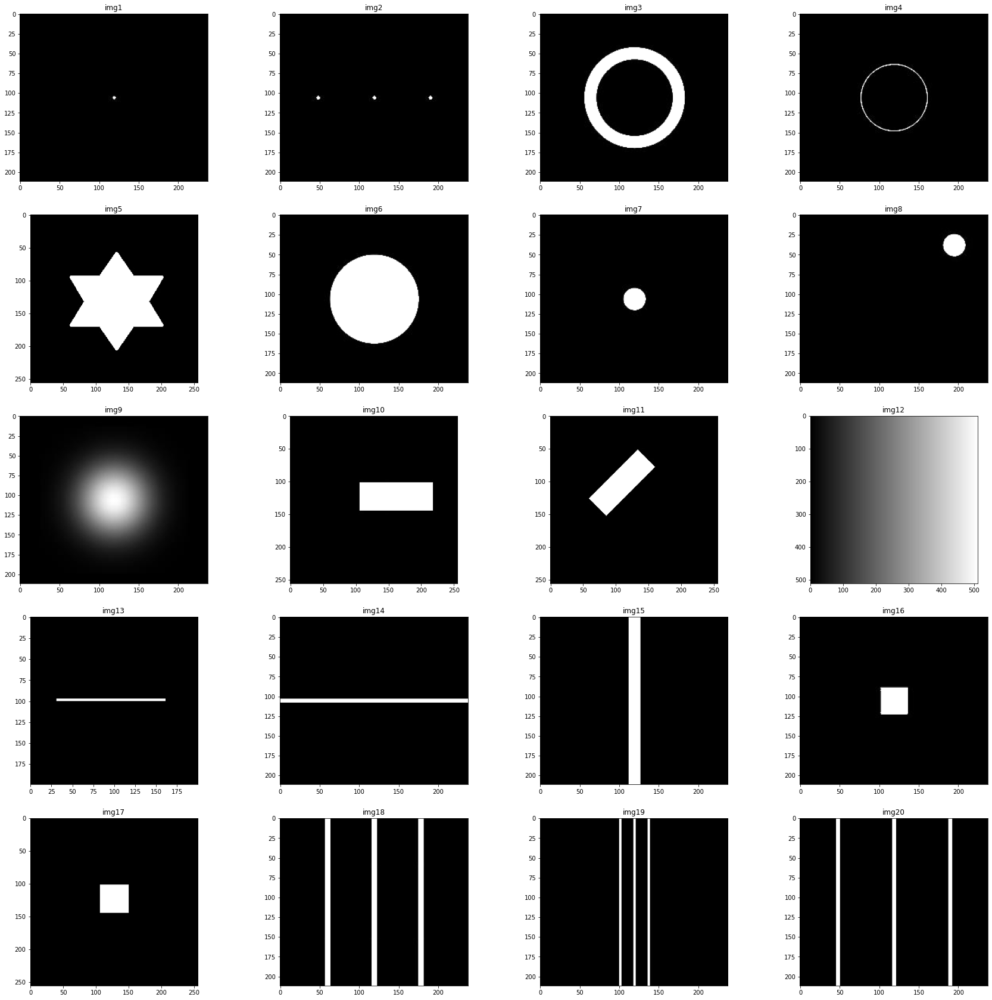

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(5,4,1);plt.imshow(img1,cmap='gray'), plt.title('img1')
plt.subplot(5,4,2);plt.imshow(img2,cmap='gray'), plt.title('img2')
plt.subplot(5,4,3);plt.imshow(img3,cmap='gray'), plt.title('img3')
plt.subplot(5,4,4);plt.imshow(img4,cmap='gray'), plt.title('img4')
plt.subplot(5,4,5);plt.imshow(img5,cmap='gray'), plt.title('img5')
plt.subplot(5,4,6);plt.imshow(img6,cmap='gray'), plt.title('img6')
plt.subplot(5,4,7);plt.imshow(img7,cmap='gray'), plt.title('img7')
plt.subplot(5,4,8);plt.imshow(img8,cmap='gray'), plt.title('img8')
plt.subplot(5,4,9);plt.imshow(img9,cmap='gray'), plt.title('img9')
plt.subplot(5,4,10);plt.imshow(img10,cmap='gray'), plt.title('img10')
plt.subplot(5,4,11);plt.imshow(img11,cmap='gray'), plt.title('img11')
plt.subplot(5,4,12);plt.imshow(img12,cmap='gray'), plt.title('img12')
plt.subplot(5,4,13);plt.imshow(img13,cmap='gray'), plt.title('img13')
plt.subplot(5,4,14);plt.imshow(img14,cmap='gray'), plt.title('img14')
plt.subplot(5,4,15);plt.imshow(img15,cmap='gray'), plt.title('img15')
plt.subplot(5,4,16);plt.imshow(img16,cmap='gray'), plt.title('img16')
plt.subplot(5,4,17);plt.imshow(img17,cmap='gray'), plt.title('img17')
plt.subplot(5,4,18);plt.imshow(img18,cmap='gray'), plt.title('img18')
plt.subplot(5,4,19);plt.imshow(img19,cmap='gray'), plt.title('img19')
plt.subplot(5,4,20);plt.imshow(img20,cmap='gray'), plt.title('img20')

display their histograms for thresholding operation

In [ ]:
hist1=cv2.calcHist([img1], [0], None, [256], [0,255] )
hist2=cv2.calcHist([img2], [0], None, [256], [0,255] )
hist3=cv2.calcHist([img3], [0], None, [256], [0,255] )
hist4=cv2.calcHist([img4], [0], None, [256], [0,255] )
hist5=cv2.calcHist([img5], [0], None, [256], [0,255] )
hist6=cv2.calcHist([img6], [0], None, [256], [0,255] )
hist7=cv2.calcHist([img7], [0], None, [256], [0,255] )
hist8=cv2.calcHist([img8], [0], None, [256], [0,255] )
hist9=cv2.calcHist([img9], [0], None, [256], [0,255] )
hist10=cv2.calcHist([img10], [0], None, [256], [0,255] )
hist11=cv2.calcHist([img11], [0], None, [256], [0,255] )
hist12=cv2.calcHist([img12], [0], None, [256], [0,255] )
hist13=cv2.calcHist([img13], [0], None, [256], [0,255] )
hist14=cv2.calcHist([img14], [0], None, [256], [0,255] )
hist15=cv2.calcHist([img15], [0], None, [256], [0,255] )
hist16=cv2.calcHist([img16], [0], None, [256], [0,255] )
hist17=cv2.calcHist([img17], [0], None, [256], [0,255] )
hist18=cv2.calcHist([img18], [0], None, [256], [0,255] )
hist19=cv2.calcHist([img19], [0], None, [256], [0,255] )
hist20=cv2.calcHist([img20], [0], None, [256], [0,255] )

([<matplotlib.lines.Line2D at 0x7ffbad2e8850>], Text(0.5, 1.0, 'img20'))

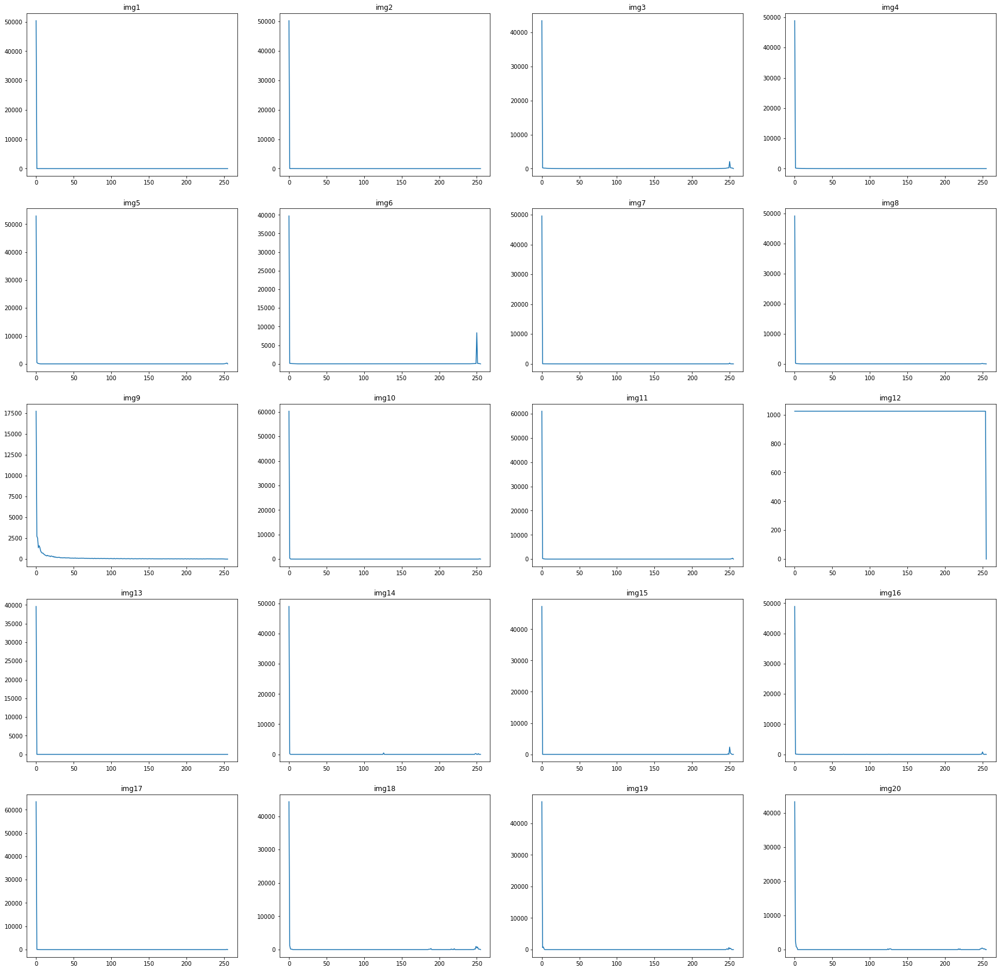

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(5,4,1);plt.plot(hist1), plt.title('img1')
plt.subplot(5,4,2);plt.plot(hist2), plt.title('img2')
plt.subplot(5,4,3);plt.plot(hist3), plt.title('img3')
plt.subplot(5,4,4);plt.plot(hist4), plt.title('img4')
plt.subplot(5,4,5);plt.plot(hist5), plt.title('img5')
plt.subplot(5,4,6);plt.plot(hist6), plt.title('img6')
plt.subplot(5,4,7);plt.plot(hist7), plt.title('img7')
plt.subplot(5,4,8);plt.plot(hist8), plt.title('img8')
plt.subplot(5,4,9);plt.plot(hist9), plt.title('img9')
plt.subplot(5,4,10);plt.plot(hist10), plt.title('img10')
plt.subplot(5,4,11);plt.plot(hist11), plt.title('img11')
plt.subplot(5,4,12);plt.plot(hist12), plt.title('img12')
plt.subplot(5,4,13);plt.plot(hist13), plt.title('img13')
plt.subplot(5,4,14);plt.plot(hist14), plt.title('img14')
plt.subplot(5,4,15);plt.plot(hist15), plt.title('img15')
plt.subplot(5,4,16);plt.plot(hist16), plt.title('img16')
plt.subplot(5,4,17);plt.plot(hist17), plt.title('img17')
plt.subplot(5,4,18);plt.plot(hist18), plt.title('img18')
plt.subplot(5,4,19);plt.plot(hist19), plt.title('img19')
plt.subplot(5,4,20);plt.plot(hist20), plt.title('img20')

after that , we must find a suitable limit for thresholding ----> image 1 & 2 & 4 & 6 & 10 & 13 & 17 didn't change drastically

In [ ]:
img1[img1>100]=255
img2[img2>100]=255
img3[img3>200]=255
img4[img4>100]=255
img5[img5>100]=255
img7[img7>100]=255
img8[img8>100]=255
img10[img10>100]=255
img11[img11>100]=255
img13[img13>100]=255
img14[img14>100]=255
img15[img15>100]=255
img16[img16>100]=255
img17[img17>100]=255
img18[img18>100]=255
img19[img19>100]=255
img20[img20>100]=255

next , show their new histograms

In [ ]:
hist1=cv2.calcHist([img1], [0], None, [256], [0,255])
hist2=cv2.calcHist([img2], [0], None, [256], [0,255])
hist3=cv2.calcHist([img3], [0], None, [256], [0,255])
hist4=cv2.calcHist([img4], [0], None, [256], [0,255])
hist5=cv2.calcHist([img5], [0], None, [256], [0,255])
hist6=cv2.calcHist([img6], [0], None, [256], [0,255])
hist7=cv2.calcHist([img7], [0], None, [256], [0,255])
hist8=cv2.calcHist([img8], [0], None, [256], [0,255])
hist9=cv2.calcHist([img9], [0], None, [256], [0,255])
hist10=cv2.calcHist([img10], [0], None, [256], [0,255])
hist11=cv2.calcHist([img11], [0], None, [256], [0,255])
hist12=cv2.calcHist([img12], [0], None, [256], [0,255])
hist13=cv2.calcHist([img13], [0], None, [256], [0,255])
hist14=cv2.calcHist([img14], [0], None, [256], [0,255])
hist15=cv2.calcHist([img15], [0], None, [256], [0,255])
hist16=cv2.calcHist([img16], [0], None, [256], [0,255])
hist17=cv2.calcHist([img17], [0], None, [256], [0,255])
hist18=cv2.calcHist([img18], [0], None, [256], [0,255])
hist19=cv2.calcHist([img19], [0], None, [256], [0,255])
hist20=cv2.calcHist([img20], [0], None, [256], [0,255])

([<matplotlib.lines.Line2D at 0x7ffba8d3b310>], Text(0.5, 1.0, 'img20'))

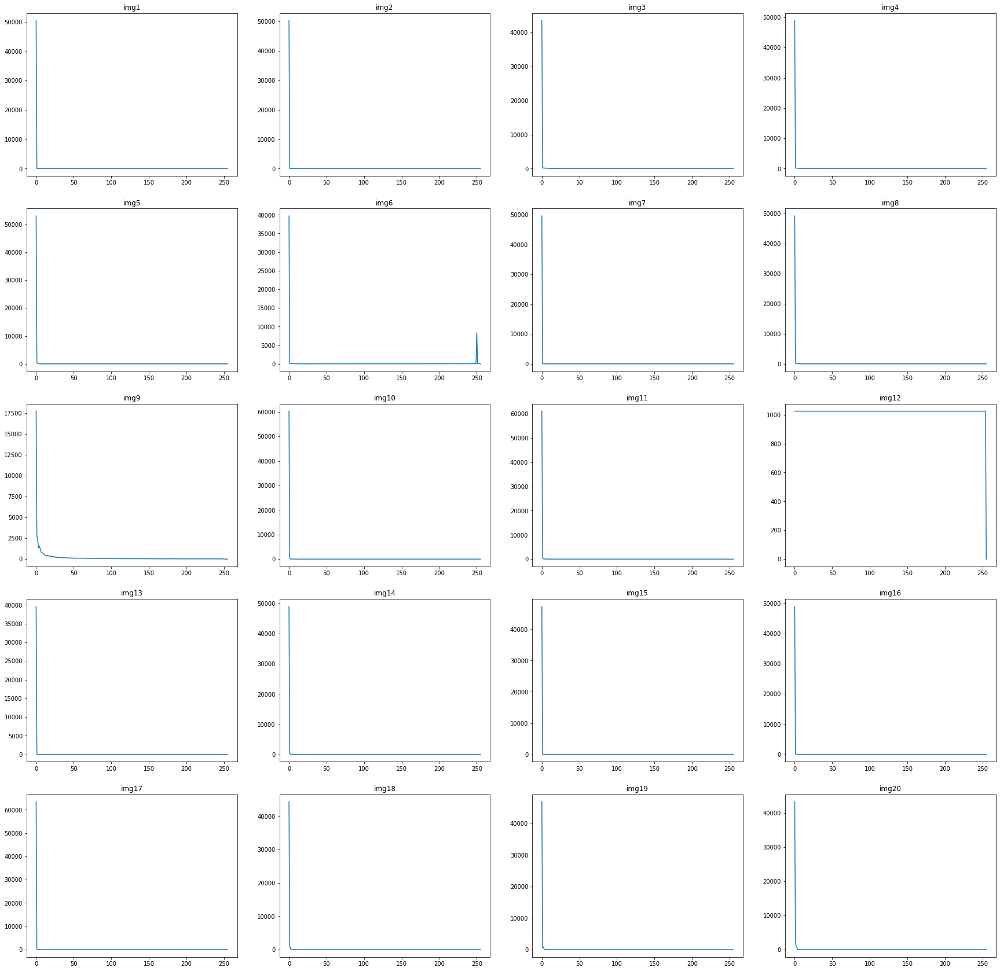

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(5,4,1);plt.plot(hist1), plt.title('img1')
plt.subplot(5,4,2);plt.plot(hist2), plt.title('img2')
plt.subplot(5,4,3);plt.plot(hist3), plt.title('img3')
plt.subplot(5,4,4);plt.plot(hist4), plt.title('img4')
plt.subplot(5,4,5);plt.plot(hist5), plt.title('img5')
plt.subplot(5,4,6);plt.plot(hist6), plt.title('img6')
plt.subplot(5,4,7);plt.plot(hist7), plt.title('img7')
plt.subplot(5,4,8);plt.plot(hist8), plt.title('img8')
plt.subplot(5,4,9);plt.plot(hist9), plt.title('img9')
plt.subplot(5,4,10);plt.plot(hist10), plt.title('img10')
plt.subplot(5,4,11);plt.plot(hist11), plt.title('img11')
plt.subplot(5,4,12);plt.plot(hist12), plt.title('img12')
plt.subplot(5,4,13);plt.plot(hist13), plt.title('img13')
plt.subplot(5,4,14);plt.plot(hist14), plt.title('img14')
plt.subplot(5,4,15);plt.plot(hist15), plt.title('img15')
plt.subplot(5,4,16);plt.plot(hist16), plt.title('img16')
plt.subplot(5,4,17);plt.plot(hist17), plt.title('img17')
plt.subplot(5,4,18);plt.plot(hist18), plt.title('img18')
plt.subplot(5,4,19);plt.plot(hist19), plt.title('img19')
plt.subplot(5,4,20);plt.plot(hist20), plt.title('img20')

convert their types to float64

In [ ]:
img1=img1.astype('float64')
img2=img2.astype('float64')
img3=img3.astype('float64')
img4=img4.astype('float64')
img6=img6.astype('float64')
img7=img7.astype('float64')
img8=img8.astype('float64')
img10=img10.astype('float64')
img11=img11.astype('float64')
img13=img13.astype('float64')
img14=img14.astype('float64')
img15=img15.astype('float64')
img16=img16.astype('float64')
img17=img17.astype('float64')
img18=img18.astype('float64')
img19=img19.astype('float64')
img20=img20.astype('float64')

display new images

(<matplotlib.image.AxesImage at 0x7ffba75eb4d0>, Text(0.5, 1.0, 'img20'))

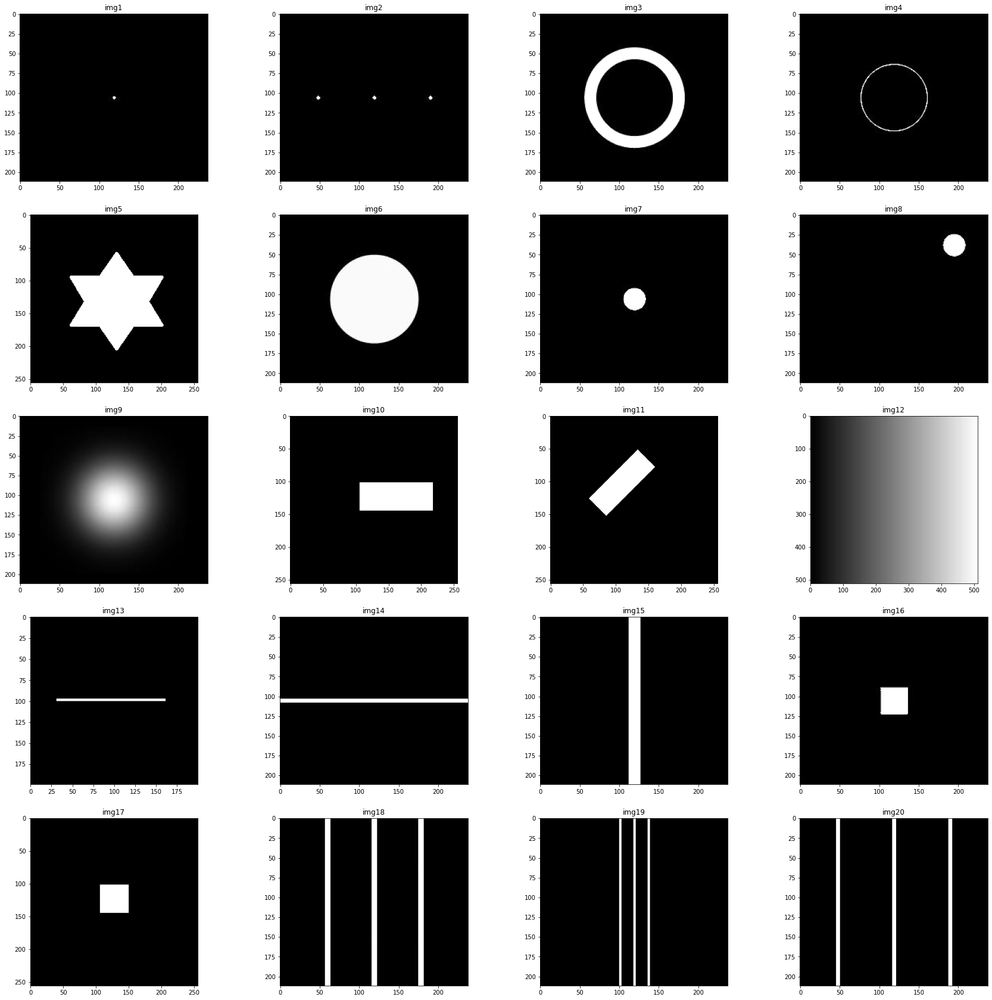

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(5,4,1);plt.imshow(img1,cmap='gray'), plt.title('img1')
plt.subplot(5,4,2);plt.imshow(img2,cmap='gray'), plt.title('img2')
plt.subplot(5,4,3);plt.imshow(img3,cmap='gray'), plt.title('img3')
plt.subplot(5,4,4);plt.imshow(img4,cmap='gray'), plt.title('img4')
plt.subplot(5,4,5);plt.imshow(img5,cmap='gray'), plt.title('img5')
plt.subplot(5,4,6);plt.imshow(img6,cmap='gray'), plt.title('img6')
plt.subplot(5,4,7);plt.imshow(img7,cmap='gray'), plt.title('img7')
plt.subplot(5,4,8);plt.imshow(img8,cmap='gray'), plt.title('img8')
plt.subplot(5,4,9);plt.imshow(img9,cmap='gray'), plt.title('img9')
plt.subplot(5,4,10);plt.imshow(img10,cmap='gray'), plt.title('img10')
plt.subplot(5,4,11);plt.imshow(img11,cmap='gray'), plt.title('img11')
plt.subplot(5,4,12);plt.imshow(img12,cmap='gray'), plt.title('img12')
plt.subplot(5,4,13);plt.imshow(img13,cmap='gray'), plt.title('img13')
plt.subplot(5,4,14);plt.imshow(img14,cmap='gray'), plt.title('img14')
plt.subplot(5,4,15);plt.imshow(img15,cmap='gray'), plt.title('img15')
plt.subplot(5,4,16);plt.imshow(img16,cmap='gray'), plt.title('img16')
plt.subplot(5,4,17);plt.imshow(img17,cmap='gray'), plt.title('img17')
plt.subplot(5,4,18);plt.imshow(img18,cmap='gray'), plt.title('img18')
plt.subplot(5,4,19);plt.imshow(img19,cmap='gray'), plt.title('img19')
plt.subplot(5,4,20);plt.imshow(img20,cmap='gray'), plt.title('img20')

then , we use fourier transform to show fourier space of our images

In [ ]:
def fourierT (img):
  fim = (fftpack.fft2(img))
  fimshift = fftpack.fftshift(fim)
  ft=np.log(abs(fimshift)+1)
  return ft

show fourier space of images

(<matplotlib.image.AxesImage at 0x7ffba6d78410>, Text(0.5, 1.0, 'img20'))

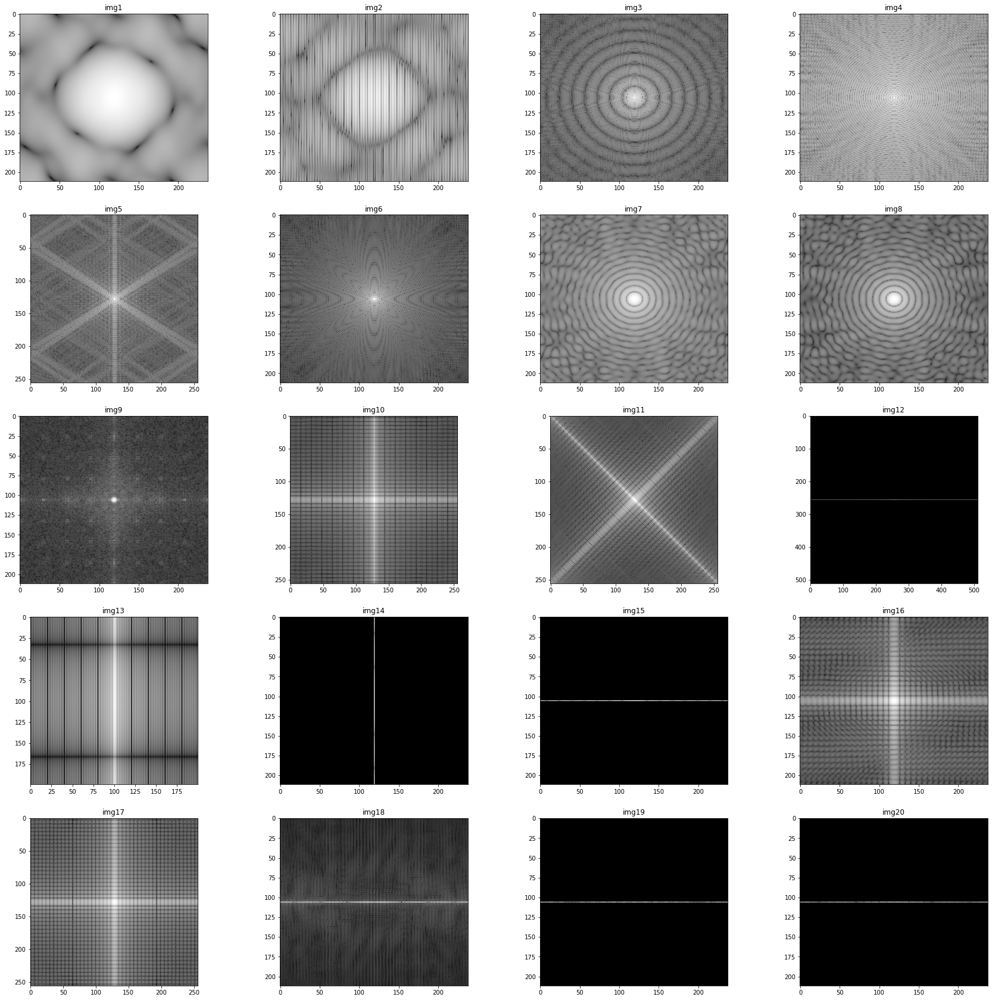

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(5,4,1);plt.imshow(fourierT(img1),cmap='gray'), plt.title('img1')
plt.subplot(5,4,2);plt.imshow(fourierT(img2),cmap='gray'), plt.title('img2')
plt.subplot(5,4,3);plt.imshow(fourierT(img3),cmap='gray'), plt.title('img3')
plt.subplot(5,4,4);plt.imshow(fourierT(img4),cmap='gray'), plt.title('img4')
plt.subplot(5,4,5);plt.imshow(fourierT(img5),cmap='gray'), plt.title('img5')
plt.subplot(5,4,6);plt.imshow(fourierT(img6),cmap='gray'), plt.title('img6')
plt.subplot(5,4,7);plt.imshow(fourierT(img7),cmap='gray'), plt.title('img7')
plt.subplot(5,4,8);plt.imshow(fourierT(img8),cmap='gray'), plt.title('img8')
plt.subplot(5,4,9);plt.imshow(fourierT(img9),cmap='gray'), plt.title('img9')
plt.subplot(5,4,10);plt.imshow(fourierT(img10),cmap='gray'), plt.title('img10')
plt.subplot(5,4,11);plt.imshow(fourierT(img11),cmap='gray'), plt.title('img11')
plt.subplot(5,4,12);plt.imshow(fourierT(img12),cmap='gray'), plt.title('img12')
plt.subplot(5,4,13);plt.imshow(fourierT(img13),cmap='gray'), plt.title('img13')
plt.subplot(5,4,14);plt.imshow(fourierT(img14),cmap='gray'), plt.title('img14')
plt.subplot(5,4,15);plt.imshow(fourierT(img15),cmap='gray'), plt.title('img15')
plt.subplot(5,4,16);plt.imshow(fourierT(img16),cmap='gray'), plt.title('img16')
plt.subplot(5,4,17);plt.imshow(fourierT(img17),cmap='gray'), plt.title('img17')
plt.subplot(5,4,18);plt.imshow(fourierT(img18),cmap='gray'), plt.title('img18')
plt.subplot(5,4,19);plt.imshow(fourierT(img19),cmap='gray'), plt.title('img19')
plt.subplot(5,4,20);plt.imshow(fourierT(img20),cmap='gray'), plt.title('img20')

let's compare these results

compare 1 -----> image 1 & 2

Text(0.5, 1.0, 'img2')

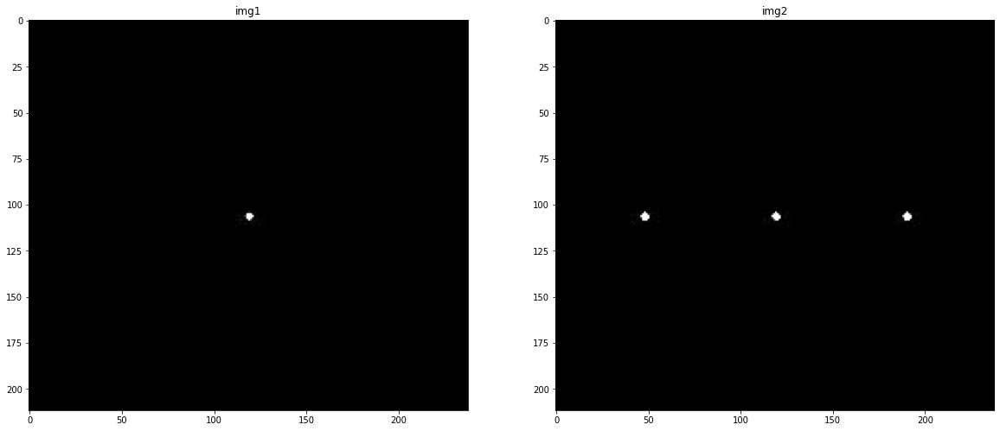

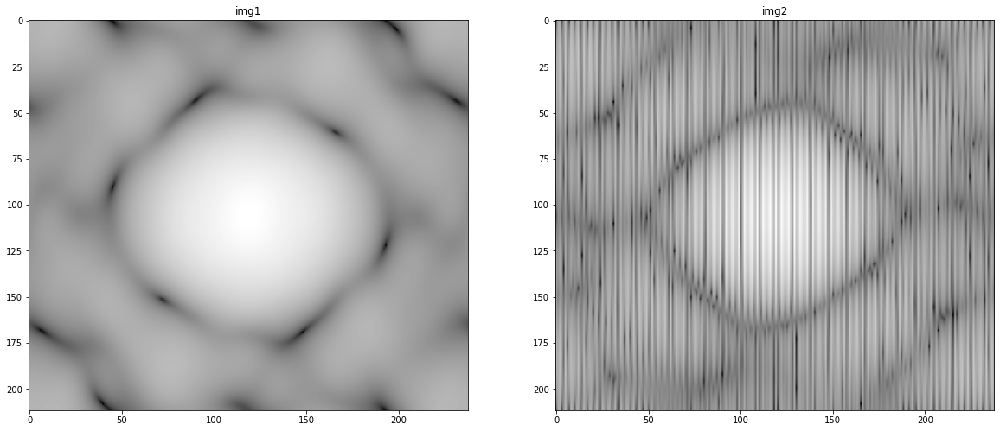

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1);plt.imshow(img1,cmap='gray');plt.title('img1')
plt.subplot(1,2,2);plt.imshow(img2,cmap='gray');plt.title('img2')
plt.figure(figsize=(20,20))
plt.subplot(1,2,1);plt.imshow(fourierT(img1),cmap='gray');plt.title('img1')
plt.subplot(1,2,2);plt.imshow(fourierT(img2),cmap='gray');plt.title('img2')


The difference between the two spaces is first in the number of circular points. As a result, due to the large number of side lobs and overlapping, black lines have been created in the Fourire space of the image 2.

compare 2 -----> image 3 & 4 & 6 & 7 & 8

Text(0.5, 1.0, 'img8')

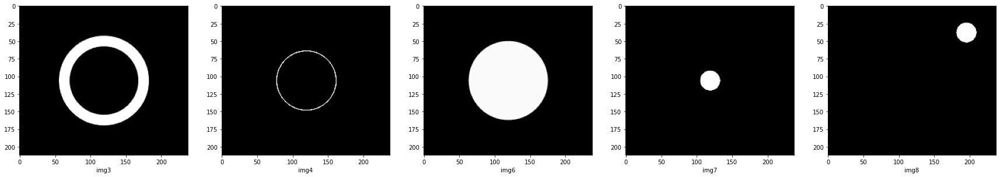

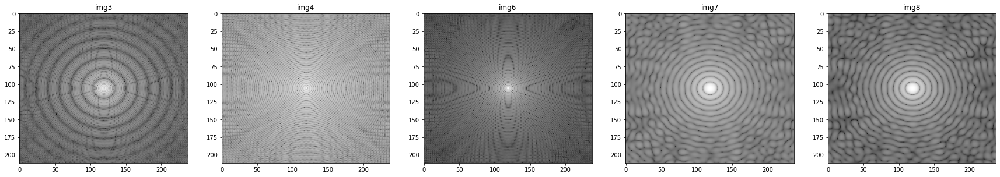

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(1,5,1);plt.imshow(img3,cmap='gray');plt.xlabel('img3')
plt.subplot(1,5,2);plt.imshow(img4,cmap='gray');plt.xlabel('img4')
plt.subplot(1,5,3);plt.imshow(img6,cmap='gray');plt.xlabel('img6')
plt.subplot(1,5,4);plt.imshow(img7,cmap='gray');plt.xlabel('img7')
plt.subplot(1,5,5);plt.imshow(img8,cmap='gray');plt.xlabel('img8')
plt.figure(figsize=(30,30))
plt.subplot(1,5,1);plt.imshow(fourierT(img3),cmap='gray');plt.title('img3')
plt.subplot(1,5,2);plt.imshow(fourierT(img4),cmap='gray');plt.title('img4')
plt.subplot(1,5,3);plt.imshow(fourierT(img6),cmap='gray');plt.title('img6')
plt.subplot(1,5,4);plt.imshow(fourierT(img7),cmap='gray');plt.title('img7')
plt.subplot(1,5,5);plt.imshow(fourierT(img8),cmap='gray');plt.title('img8')

For general comparison, the main difference is the two factors of box length and circle size.
For general comparison, the main difference is the two factors of box length and circle size.

In fact, it should be said that pictures 7 and 8 are no different. Because two circles are the same and only have different locations, the frequency space is independent of the location of the object.
In Figure 6, since the dimensions are larger than the previous state and the circle is not complete, we see the pattern formed in four directions, and as a result, moving a radial direction like the previous state does not create a specific circular pattern.

In Figures 3 and 4, due to the more severe changes in Figure 4, the effect of the box length in the Fourier space can be clearly seen.

compare 3 -----> image 10 & 11 & 16 & 17

Text(0.5, 1.0, 'img17')

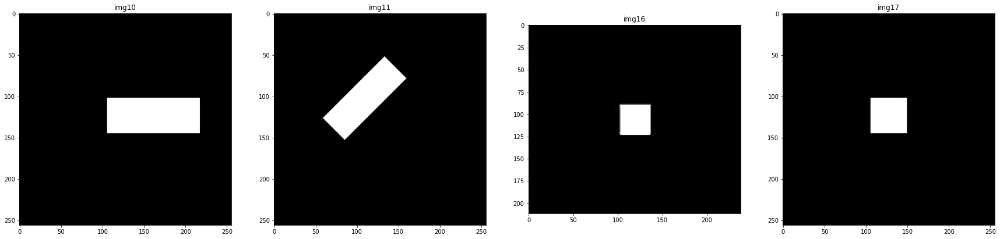

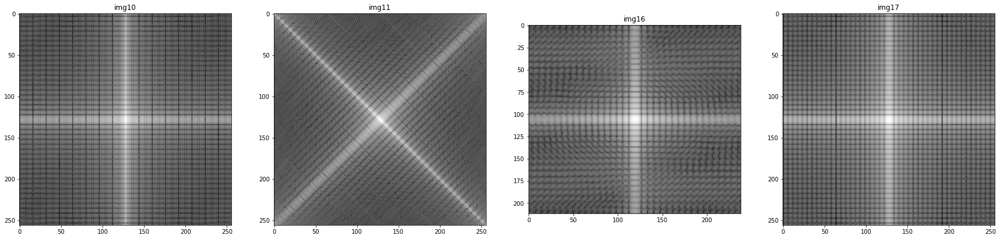

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(1,4,1);plt.imshow(img10,cmap='gray');plt.title('img10')
plt.subplot(1,4,2);plt.imshow(img11,cmap='gray');plt.title('img11')
plt.subplot(1,4,3);plt.imshow(img16,cmap='gray');plt.title('img16')
plt.subplot(1,4,4);plt.imshow(img17,cmap='gray');plt.title('img17')
plt.figure(figsize=(30,30))
plt.subplot(1,4,1);plt.imshow(fourierT(img10),cmap='gray');plt.title('img10')
plt.subplot(1,4,2);plt.imshow(fourierT(img11),cmap='gray');plt.title('img11')
plt.subplot(1,4,3);plt.imshow(fourierT(img16),cmap='gray');plt.title('img16')
plt.subplot(1,4,4);plt.imshow(fourierT(img17),cmap='gray');plt.title('img17')


By comparing the image 10 & 11 , we can clearly see the effect of rotation in the frequency space.

also in image 16 & 17 ,we can see the effect of the box size. but , the square of the image 16 is not a complete square and crate some noise on its left side, and its a difference between them in the frequency space

compare 4 -----> image 13 & 14

Text(0.5, 1.0, 'img14')

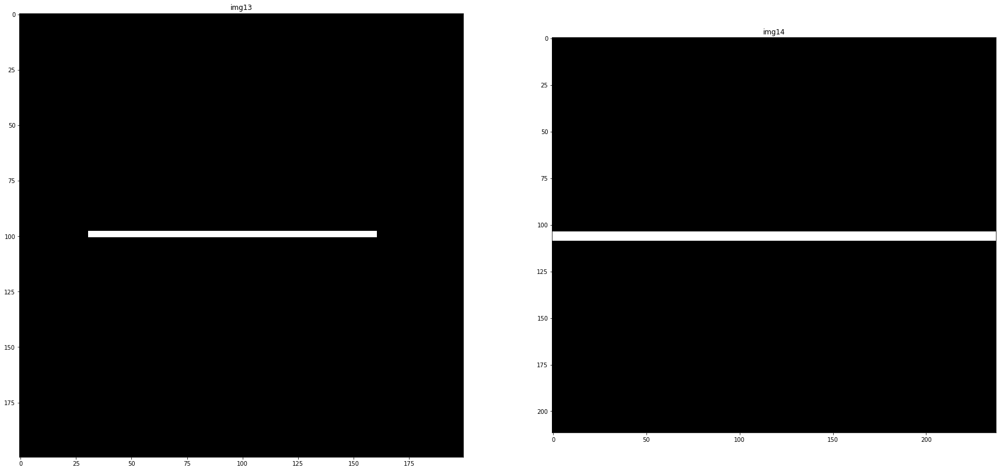

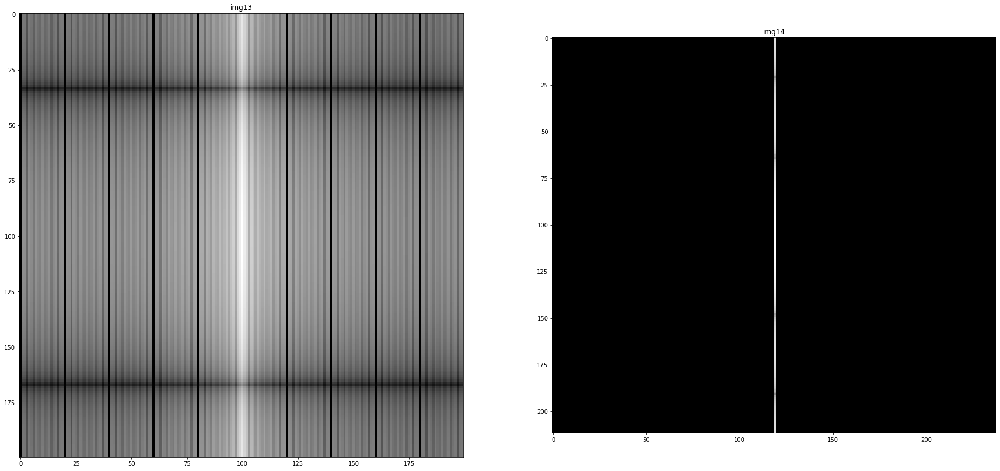

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(1,2,1);plt.imshow(img13,cmap='gray');plt.title('img13')
plt.subplot(1,2,2);plt.imshow(img14,cmap='gray');plt.title('img14')
plt.figure(figsize=(30,30))
plt.subplot(1,2,1);plt.imshow(fourierT(img13),cmap='gray');plt.title('img13')
plt.subplot(1,2,2);plt.imshow(fourierT(img14),cmap='gray');plt.title('img14')


in image 13 , we have a long box in x axis. then we have lines in both sides. and also we have a short box in y axis that it makes a line in forier space.
in image 14 , we have a line in y axis and As it turns out, it is less thick than wuth image 13. Because the box has a longer length.

compare 5 -----> image 15 & 18 & 19 & 20

Text(0.5, 1.0, 'img20')

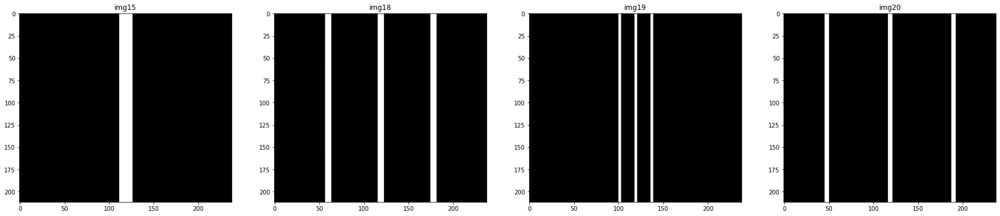

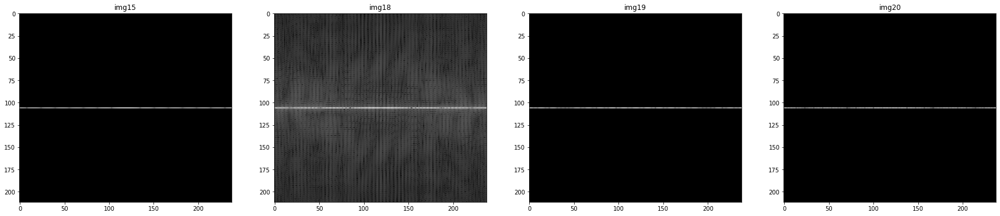

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(1,4,1);plt.imshow(img15,cmap='gray');plt.title('img15')
plt.subplot(1,4,2);plt.imshow(img18,cmap='gray');plt.title('img18')
plt.subplot(1,4,3);plt.imshow(img19,cmap='gray');plt.title('img19')
plt.subplot(1,4,4);plt.imshow(img20,cmap='gray');plt.title('img20')
plt.figure(figsize=(30,30))
plt.subplot(1,4,1);plt.imshow(fourierT(img15),cmap='gray');plt.title('img15')
plt.subplot(1,4,2);plt.imshow(fourierT(img18),cmap='gray');plt.title('img18')
plt.subplot(1,4,3);plt.imshow(fourierT(img19),cmap='gray');plt.title('img19')
plt.subplot(1,4,4);plt.imshow(fourierT(img20),cmap='gray');plt.title('img20')

In Figure 18, there may not be a fit in the image. Because there are noises in the vertical direction, and since we do not change in this direction. So the frequency space should be like the other three images.

The main difference in these images is due to the length of their box and the number of lines, which causes overlapping and consequently impact-like connections in the line that exists in the horizontal direction in the frequency space.

compare one by one -----> image 5 & 9 & 12

Text(0.5, 1.0, 'img12')

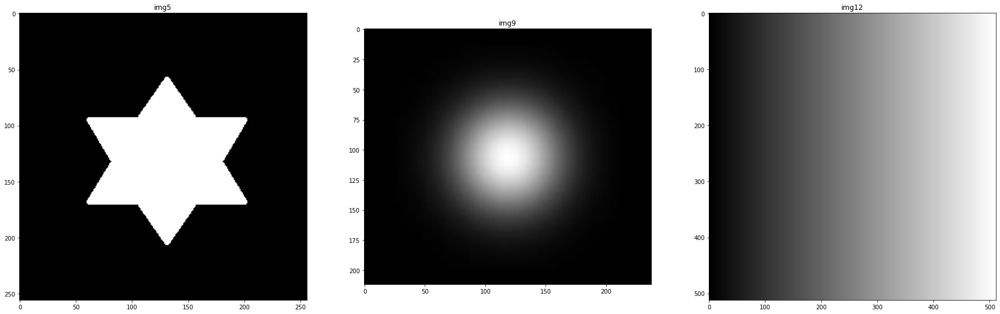

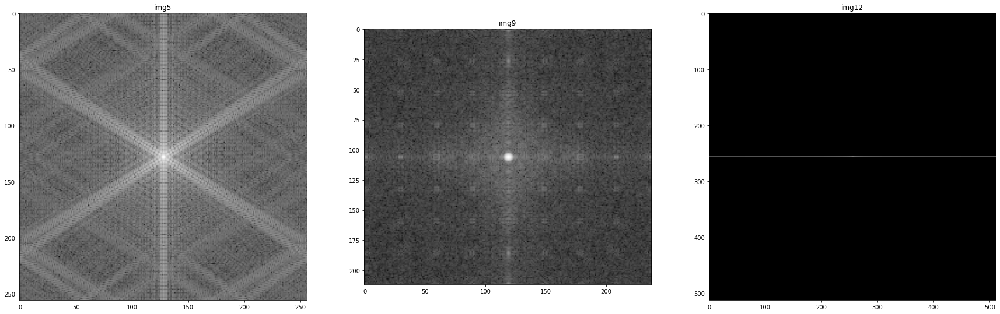

In [ ]:
plt.figure(figsize=(30,30))
plt.subplot(1,3,1);plt.imshow(img5,cmap='gray');plt.title('img5')
plt.subplot(1,3,2);plt.imshow(img9,cmap='gray');plt.title('img9')
plt.subplot(1,3,3);plt.imshow(img12,cmap='gray');plt.title('img12')
plt.figure(figsize=(30,30))
plt.subplot(1,3,1);plt.imshow(fourierT(img5),cmap='gray');plt.title('img5')
plt.subplot(1,3,2);plt.imshow(fourierT(img9),cmap='gray');plt.title('img9')
plt.subplot(1,3,3);plt.imshow(fourierT(img12),cmap='gray');plt.title('img12')

iamge 5 : in vertical and 45 & -45 degree directions, we have a same changes.

image 9 : in vertical and horiznotal directions, and center we have many changes. cuase we have low frequency in other place

image 12 : we have no chages in vertical direction and also we have a smooth change in horizontal direction. then we have a simple line in frequency space

Exercise_2

Import images and covert to grayscale mode



In [ ]:
img1 = cv2.imread('checker.tif', 0)
img2 = cv2.imread('checker-large.tif', 0)
img3 = cv2.imread('Sine_noised.png', 0)
img4 = cv2.imread('sinusoidal2.tif', 0)

show images

Text(0.5, 1.0, 'img4')

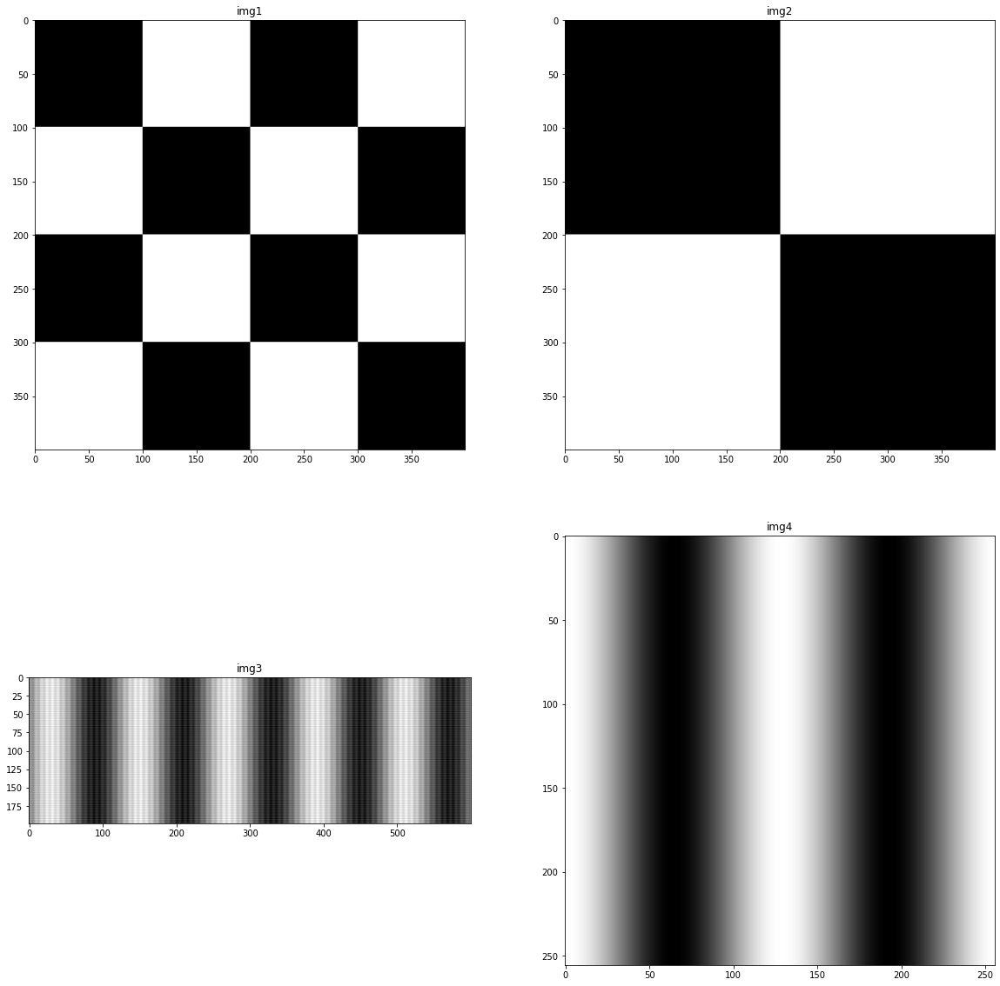

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1);plt.imshow(img1,cmap='gray');plt.title('img1')
plt.subplot(2,2,2);plt.imshow(img2,cmap='gray');plt.title('img2')
plt.subplot(2,2,3);plt.imshow(img3,cmap='gray');plt.title('img3')
plt.subplot(2,2,4);plt.imshow(img4,cmap='gray');plt.title('img4')

display their histogram for thresholding

In [ ]:
hist1=cv2.calcHist([img1], [0], None, [256], [0,255])
hist2=cv2.calcHist([img2], [0], None, [256], [0,255])
hist3=cv2.calcHist([img3], [0], None, [256], [0,255])
hist4=cv2.calcHist([img4], [0], None, [256], [0,255])

Text(0.5, 0, 'img4')

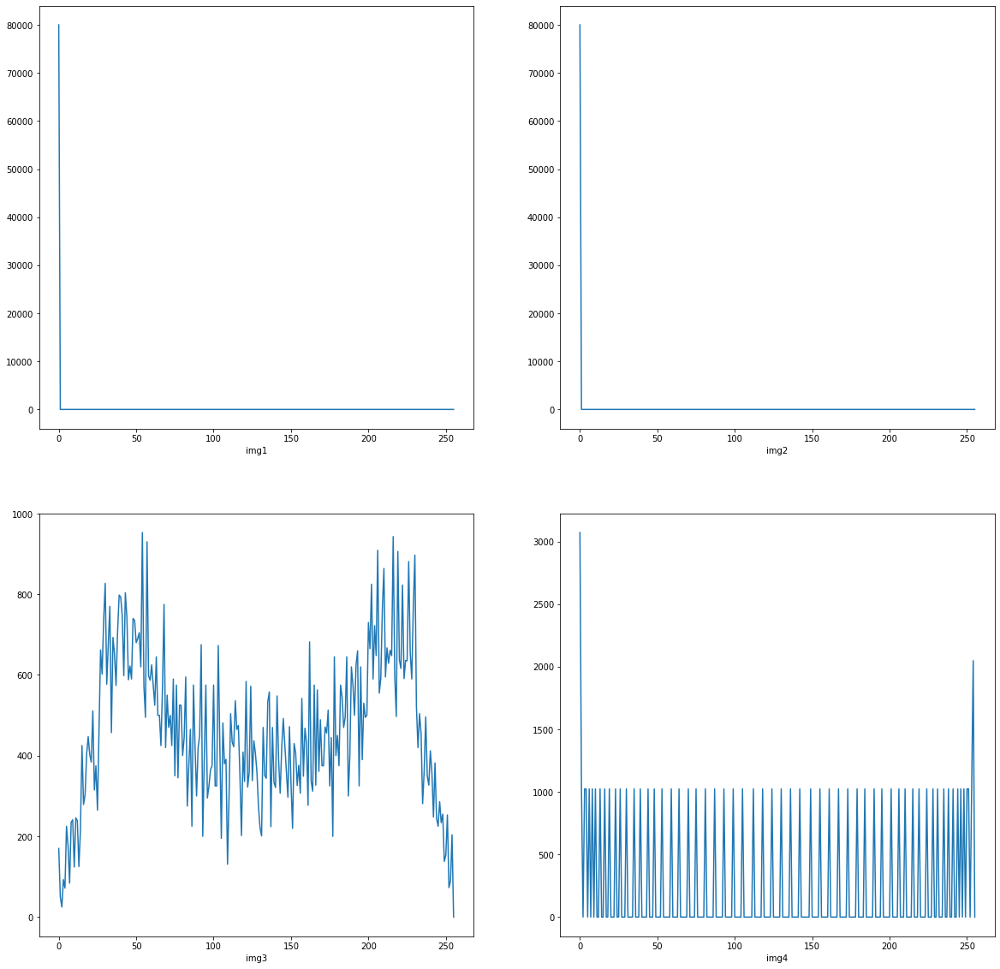

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1);plt.plot(hist1);plt.xlabel('img1')
plt.subplot(2,2,2);plt.plot(hist2);plt.xlabel('img2')
plt.subplot(2,2,3);plt.plot(hist3,);plt.xlabel('img3')
plt.subplot(2,2,4);plt.plot(hist4);plt.xlabel('img4')

In [ ]:
img3[img3>1]=255
img4[img4>1]=255

show new fourier images

Text(0.5, 1.0, 'img2')

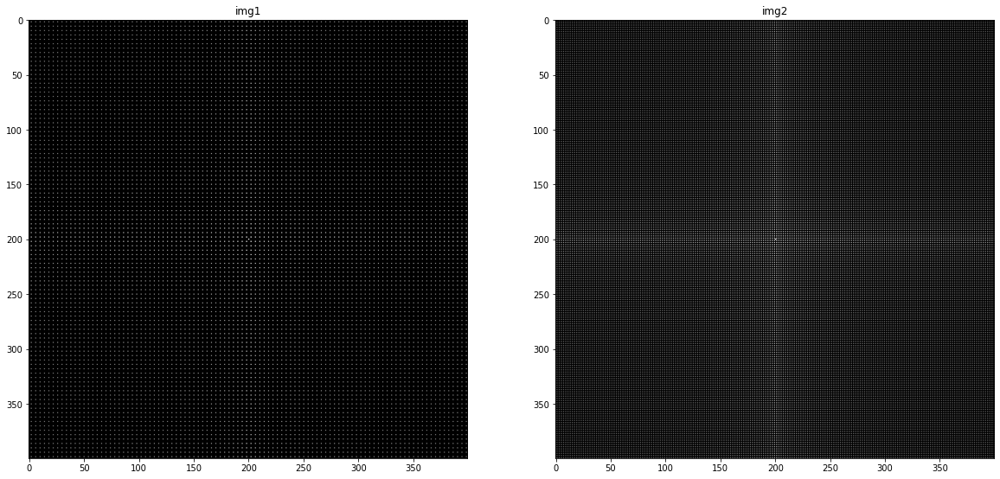

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1);plt.imshow(fourierT(img1),cmap='gray');plt.title('img1')
plt.subplot(1,2,2);plt.imshow(fourierT(img2),cmap='gray');plt.title('img2')

Text(0.5, 1.0, 'img4')

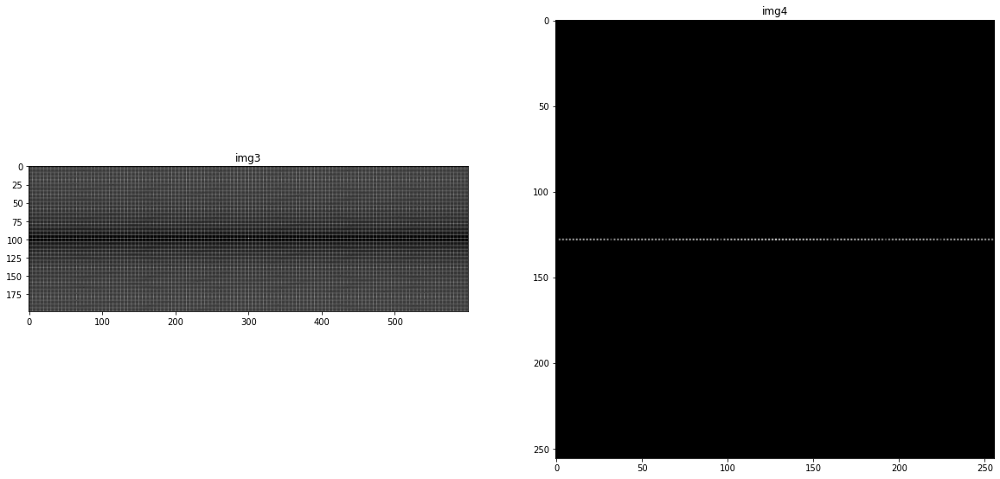

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1);plt.imshow(fourierT(img3),cmap='gray');plt.title('img3')
plt.subplot(1,2,2);plt.imshow(fourierT(img4),cmap='gray');plt.title('img4')

According to Fourier spaces, the explanation is that Figure 3 has more changes than Figure 4. Therefore, more frequencies are also involved in Fourier space. In Figures 1 and 2, according to the histogram, we can see that their Fourier space is different in x & y axis.

Exercise_3

import images and final images

In [ ]:
img1 = cv2.imread('boy_noisy1.png')
img2 = cv2.imread('bricks1.png')
img3 = cv2.imread('fingerprint1.png')
img4 = cv2.imread('moon1.png')
img5 = cv2.imread('noiseball1.png')
img6 = cv2.imread('noisy-text1.png')

show results after filtering

Text(0.5, 1.0, 'img6')

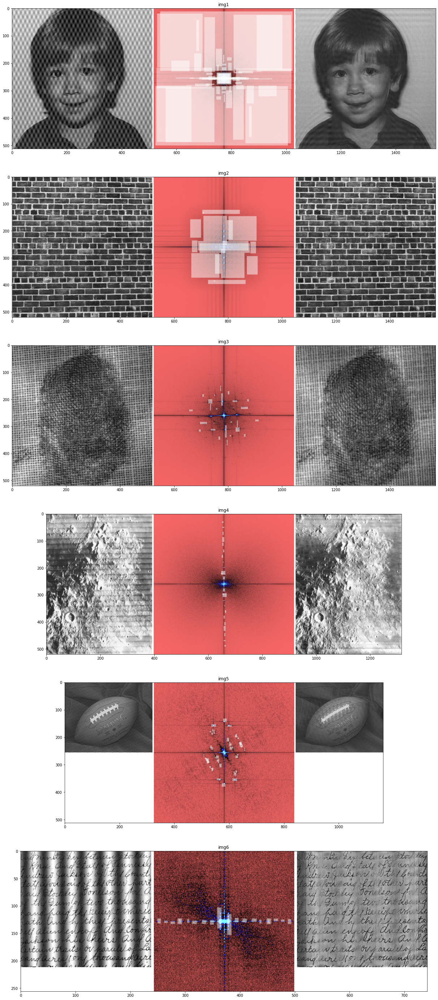

In [ ]:
plt.figure(figsize=(50,50))
plt.subplot(6,1,1);plt.imshow(img1);plt.title('img1')
plt.subplot(6,1,2);plt.imshow(img2);plt.title('img2')
plt.subplot(6,1,3);plt.imshow(img3);plt.title('img3')
plt.subplot(6,1,4);plt.imshow(img4);plt.title('img4')
plt.subplot(6,1,5);plt.imshow(img5);plt.title('img5')
plt.subplot(6,1,6);plt.imshow(img6);plt.title('img6')